In [1]:
import pertpy as pt
import scanpy as sc
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
import seaborn as sns
from scipy import stats
from scipy import sparse 
from statsmodels.sandbox.stats.multicomp import multipletests


Installed version 0.4.0 of pertpy is newer than the latest release 0.3.0! You are running a nightly version and 
features may break!

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [2]:
%load_ext autoreload
%autoreload 2

import importlib
importlib.reload(pt)

Installed version 0.4.0 of pertpy is newer than the latest release 0.3.0! You are running a nightly version and 
features may break!

<module 'pertpy' from '/Users/tessa/miniforge3/envs/pertpy5/lib/python3.9/site-packages/pertpy/__init__.py'>

In [3]:
def test_association(adata, celltype_label = "Cluster", sample_label="Sample", condition_label = "Efficacy", conditions_compare = ("PR","SD")): 
    pvals = pd.DataFrame(1, adata.obs[celltype_label].unique().tolist(), ["mcp_"+str(n) for n in range(0,10)])
    tstats = pd.DataFrame(1, adata.obs[celltype_label].unique().tolist(), ["mcp_"+str(n) for n in range(0,10)])
    response = adata.obs.groupby(sample_label)[condition_label].agg(pd.Series.mode)
    res = dict()
    for celltype in adata.obs[celltype_label].unique().tolist():
        df = adata.obs[adata.obs[celltype_label]==celltype]

        for mcpnum in ["mcp_"+str(n) for n in range(0,10)]:
            mns = df.groupby(sample_label)[mcpnum].mean()
            mns = pd.concat([mns,response],axis=1)
            res = stats.ttest_ind(mns[mns[condition_label]==conditions_compare[0]][mcpnum],mns[mns[condition_label]==conditions_compare[1]][mcpnum])
            pvals.loc[celltype, mcpnum]=res[1]
            tstats.loc[celltype, mcpnum]=res[0]
    return pvals,tstats

In [4]:
def plot_split_violins(adata, mcp = "mcp_0", split="Efficacy", celltype_key = "Cluster"):
    df = sc.get.obs_df(adata, [celltype_key,mcp, split])
  

    p2 = sns.violinplot(data=df, x=celltype_key,y=mcp,hue=split, split=True)
    p2.set_xticklabels(p2.get_xticklabels(), rotation=45)


In [5]:
def mcp_pairsplot(adata, celltype_key = "Cluster", color = "Efficacy", mcp = "mcp_0", sample_key = "Sample"):
    mean_mcps = adata.obs.groupby([sample_key,celltype_key])[mcp].mean()
    mean_mcps = mean_mcps.reset_index()
    mcp_pivot = pd.pivot(mean_mcps[[sample_key,celltype_key,mcp]],index=sample_key,columns = celltype_key )[mcp]
    mcp_pivot = pd.concat([mcp_pivot,adata.obs.groupby([sample_key]).agg(pd.Series.mode)[color]],axis=1)
    sns.pairplot(mcp_pivot, corner=True, hue=color)
    

In [61]:
adata = sc.read_h5ad("zhang_with_PCs.h5ad")

In [62]:
adata.obs = adata.obs.rename(columns={"Number of counts": "nCounts"})

#adata.obs['Number of counts']

In [63]:
# tumor samples only
adata = adata[adata.obs['Origin']=="t" ,:].copy()

In [64]:
# pre-treatment samples only 
adata = adata[adata.obs['Sample'].str.contains('Pre'),:].copy()

In [65]:
# isecs = adata.obs.groupby(["Cluster", "Sample"]).size()
isecs = pd.crosstab(adata.obs['Cluster'], adata.obs['Sample'])

(array([ 5.,  8.,  6.,  1.,  8.,  3., 10.,  4.,  7.,  5.]),
 array([ 0. ,  1.5,  3. ,  4.5,  6. ,  7.5,  9. , 10.5, 12. , 13.5, 15. ]),
 <BarContainer object of 10 artists>)

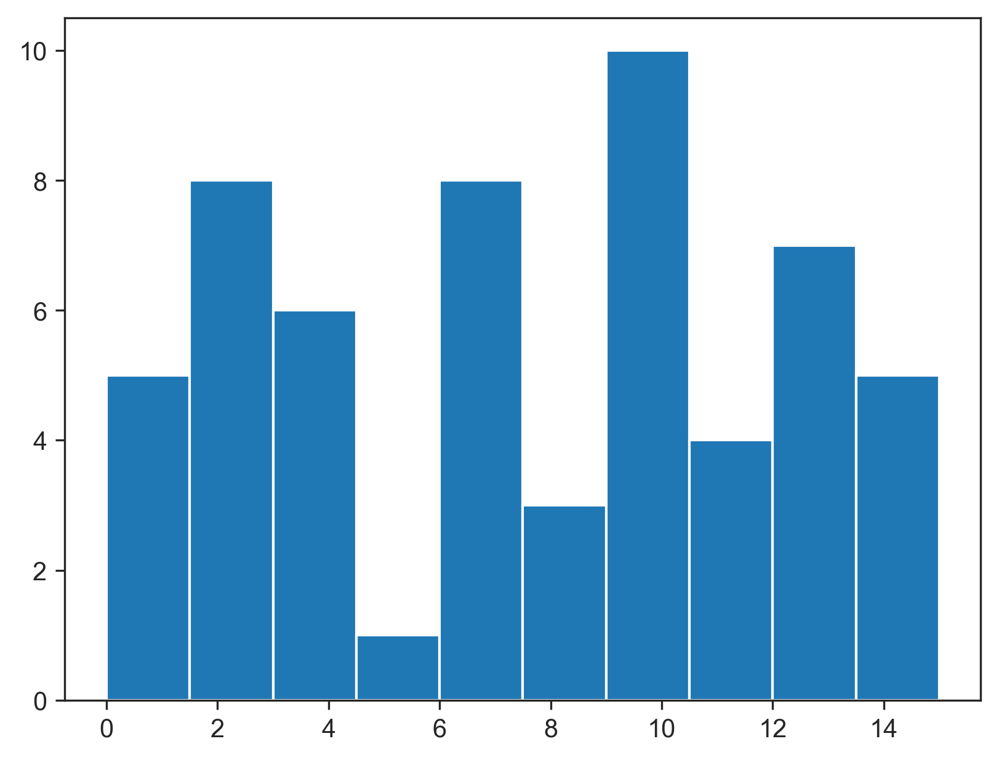

In [66]:
plt.hist((isecs >3).sum(axis=1))

In [67]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]]

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_pB-IGHG1,679,8,12,12,4,301,4,136,14,238,1753,911,1083,206,283


In [68]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]-1]

# drop sample Pre_P010_t 

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_CD4_Tcm-LMNA,4,392,569,249,0,288,6,311,20,134,555,77,593,444,87
t_CD4_Treg-FOXP3,13,338,110,62,0,464,24,419,17,518,769,743,398,122,130
t_CD8_Tem-GZMK,8,957,368,72,0,417,17,176,21,154,2354,202,709,891,292
t_Tn-LEF1,11,98,110,3494,0,1269,22,50,609,167,4010,175,1501,388,271


In [69]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]-2]
# drop Pre_P013_t, Pre_P017_t, Pre_P002_2

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_Bmem-CD27,377,11,12,105,0,1950,0,11,166,22,4210,132,309,121,400
t_CD8_MAIT-KLRB1,0,51,1244,45,0,40,7,84,24,19,67,14,38,20,11
t_CD8_Trm-ZNF683,3,76,180,71,0,143,4,407,4,226,422,121,449,219,150
t_mono-FCN1,4,60,11,12,0,14,23,44,1,31,43,15,51,33,16


In [70]:
celltypes = isecs[(isecs > 3).sum(axis=1) >= np.shape(isecs)[1]-2].index.values.to_list()

In [71]:
# subset to cell types with sufficient expression
adata = adata[adata.obs['Cluster'].isin(celltypes),:].copy()

In [72]:
adata

AnnData object with n_obs × n_vars = 44636 × 4000
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'nCounts', 'Number of genes', 'Major celltype', 'Cluster'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [73]:
isecs = pd.crosstab(adata.obs['Cluster'], adata.obs['Sample'])

In [74]:
keep_pts = isecs.loc[:,(isecs > 3).sum(axis=0) == isecs.shape[0]].columns.values.to_list()

In [75]:
adata = adata[adata.obs['Sample'].isin(keep_pts),:].copy()

In [76]:
pd.crosstab(adata.obs['Cluster'], adata.obs['Sample']).min(axis=1)

Cluster
t_Bmem-CD27         11
t_CD4_Tcm-LMNA      77
t_CD4_Treg-FOXP3    62
t_CD8_MAIT-KLRB1    11
t_CD8_Tem-GZMK      72
t_CD8_Trm-ZNF683    71
t_Tn-LEF1           50
t_mono-FCN1         11
t_pB-IGHG1           8
dtype: int64

In [77]:
pd.crosstab(adata.obs['Cluster'], adata.obs['Sample']).min(axis=0)

Sample
Pre_P004_t     8
Pre_P005_t    11
Pre_P007_t    12
Pre_P012_t    14
Pre_P016_t    11
Pre_P018_t    19
Pre_P019_t    43
Pre_P020_t    14
Pre_P022_t    38
Pre_P023_t    20
Pre_P025_t    11
dtype: int64

In [78]:
# cell counts look passable (though definitely low for some -- could consider dropping more things)

In [79]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [80]:
adata_plot = sc.pp.subsample(adata,  n_obs=10000, random_state=0, copy=True)


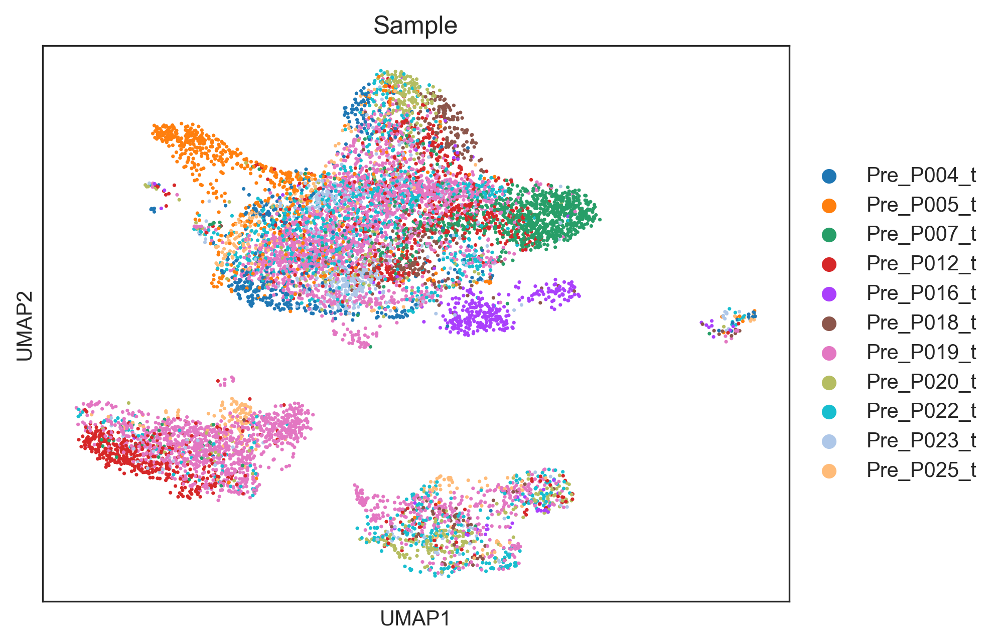

In [81]:
sc.pl.umap(
    adata_plot,
    color=[
        "Sample"
    ],
)

# definitely sample splitting -- unclear if batch effect vs interpatient variation

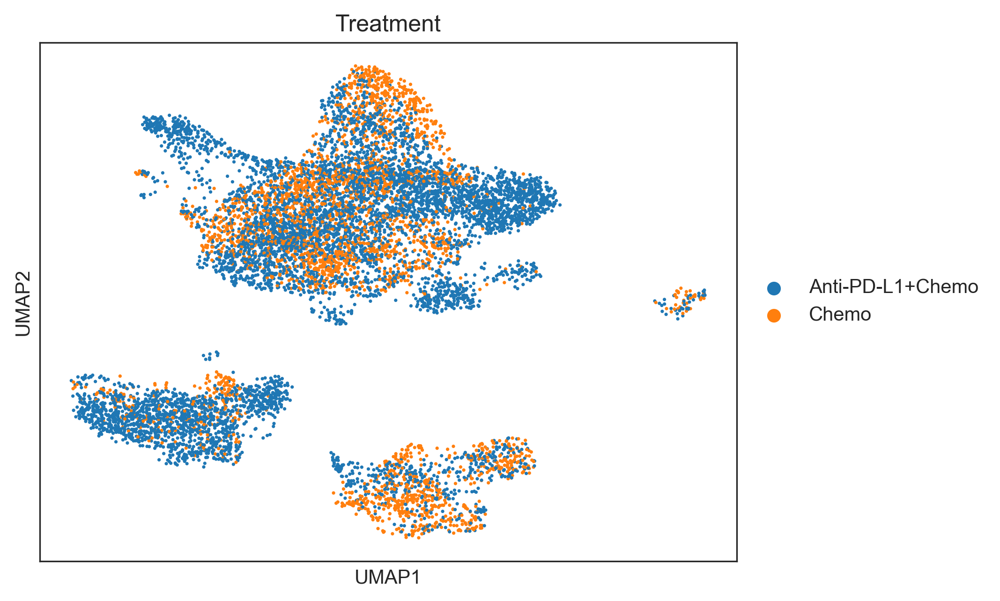

In [82]:
sc.pl.umap(
    adata_plot,
    color=[
        "Treatment"
    ],
)

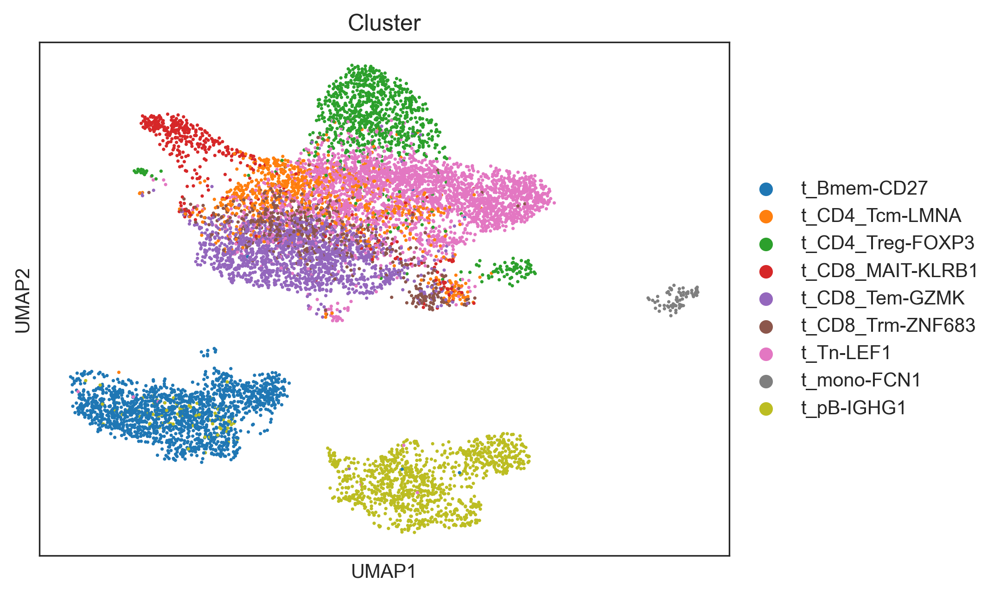

In [83]:
sc.pl.umap(
    adata_plot,
    color=[
        "Cluster"
    ],
)

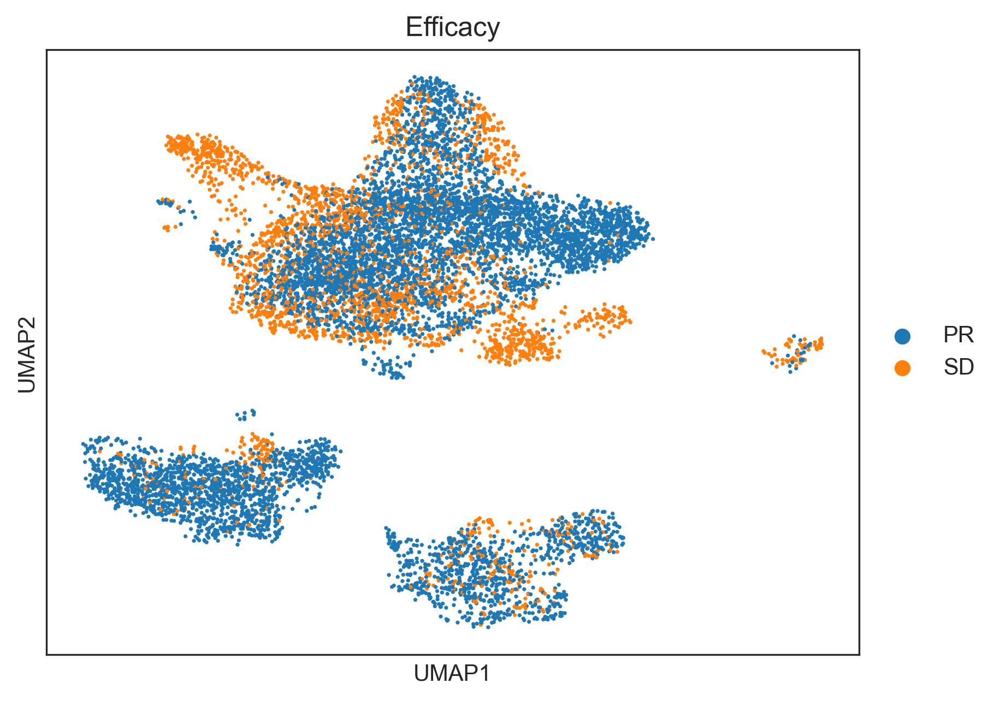

In [84]:
sc.pl.umap(
    adata_plot,
    color=[
        "Efficacy"
    ],
)

In [85]:
#dl = pt.tl.Dialogue(sample_id = "Sample",
#                   celltype_key = "Cluster",
#                   n_counts_key = "Number of counts",
#                   n_mpcs = 10)

In [86]:
#adata_stash = adata.copy()


In [87]:
# I think this will fix the problem with the multilevle modeling 
adata.X = sparse.csr_matrix(adata.X)

In [46]:
adata_1 = adata.copy()

dl_1 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_1, mcps_1, ws_1, ct_subs_1 = dl_1.calculate_multifactor_PMD(
    adata_1,
    normalize=False,
    solver="lp"
)

#adata, mcps, ws, ct_subs = dl.calculate_multifactor_PMD(
#    adata,
#    groupby='Sample',
#    celltype_key='Cluster',
#    mimic_dialogue=True,
#    n_components=10
#)

pvals_1, tstats_1 = test_association(adata_1)

In [47]:
pvals_1.min()

mcp_0    0.483565
mcp_1    0.390582
mcp_2    0.154033
mcp_3    0.060374
mcp_4    0.125419
mcp_5    0.066498
mcp_6    0.126202
mcp_7    0.076489
mcp_8    0.134388
mcp_9    0.091351
dtype: float64

In [48]:
adata_2.X

array([[-0.20700525, -0.6224626 , -0.2319455 , ..., -0.00387125,
        -0.00423328, -0.00435749],
       [-0.20700525, -0.6224626 , -0.2319455 , ..., -0.00387125,
        -0.00423328, -0.00435749],
       [-0.20700525, -0.6224626 , -0.2319455 , ..., -0.00387125,
        -0.00423328, -0.00435749],
       ...,
       [-0.20700525, -0.6224626 , -0.2319455 , ..., -0.00387125,
        -0.00423328, -0.00435749],
       [-0.20700525, -0.6224626 , -0.2319455 , ..., -0.00387125,
        -0.00423328, -0.00435749],
       [-0.20700525, -0.6224626 , -0.2319455 , ..., -0.00387125,
        -0.00423328, -0.00435749]], dtype=float32)

In [89]:
adata_2 = adata.copy()

dl_2 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "nCounts",
                   n_mpcs = 10)

adata_2, mcps_2, ws_2, ct_subs_2 = dl_2.calculate_multifactor_PMD(
    adata_2,
    normalize=True,
    solver="lp"
)

pvals_2, tstats_2 = test_association(adata_2)

In [90]:
import pickle as pkl

dlg_dict = {"mcps":mcps_2, "ws":ws_2,"ct_subs":ct_subs_2, "pvals":pvals_2, "tstats":tstats_2}
outfile =  "preliminary_results_normalizeTrue_lpsolver_033123.pkl"
with open(outfile, 'wb') as pickle_file:
    pkl.dump(dlg_dict, pickle_file)


In [91]:
pickle_file.close()


In [92]:
adata_2.write("preliminary_results_normalizeTrue_lpsolver_033123.h5ad")

In [93]:
pvals_2.min()

mcp_0    0.148392
mcp_1    0.142909
mcp_2    0.138914
mcp_3    0.135653
mcp_4    0.133086
mcp_5    0.130999
mcp_6    0.099959
mcp_7    0.050454
mcp_8    0.033683
mcp_9    0.028501
dtype: float64

In [44]:
adata_3 = adata.copy()

dl_3 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_3, mcps_3, ws_3, ct_subs_3 = dl_3.calculate_multifactor_PMD(
    adata_3,
    normalize=False,
    solver="bs"
)
pvals_3, tstats_3 = test_association(adata_3)

In [45]:
pvals_3.min()

mcp_0    0.483617
mcp_1    0.013421
mcp_2    0.350504
mcp_3    0.111273
mcp_4    0.112388
mcp_5    0.012044
mcp_6    0.110091
mcp_7    0.145990
mcp_8    0.092108
mcp_9    0.008754
dtype: float64

In [198]:
# need to implement automated chi-squared testing of efficacy w MCPs
# 
# also something for multiple testing correction

# and then need plotting utilities 
#  I'd like to get the pairs plots but need to decide which cells count as in MCP 

# also -- MCP membership -- how does that work here? 
# want to choose ones with decent correlations

In [46]:
adata_4 = adata.copy()

dl_4 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_4, mcps_4, ws_4, ct_subs_4 = dl_4.calculate_multifactor_PMD(
    adata_4,
    normalize=True,
    solver="bs"
)

In [47]:
pvals_4, tstats_4 = test_association(adata_4)

In [48]:
pvals_4.min()

mcp_0    0.088695
mcp_1    0.284868
mcp_2    0.149251
mcp_3    0.500112
mcp_4    0.007831
mcp_5    0.194837
mcp_6    0.311618
mcp_7    0.120504
mcp_8    0.006403
mcp_9    0.122496
dtype: float64

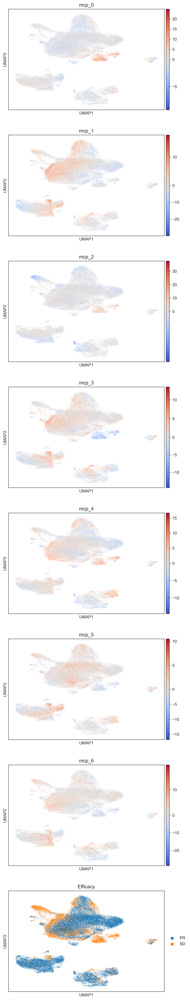

In [49]:
sc.pl.umap(adata_4, color=["mcp_0", "mcp_1", "mcp_2","mcp_3","mcp_4","mcp_5","mcp_6","Efficacy"], ncols=1, cmap='coolwarm', vcenter=0)


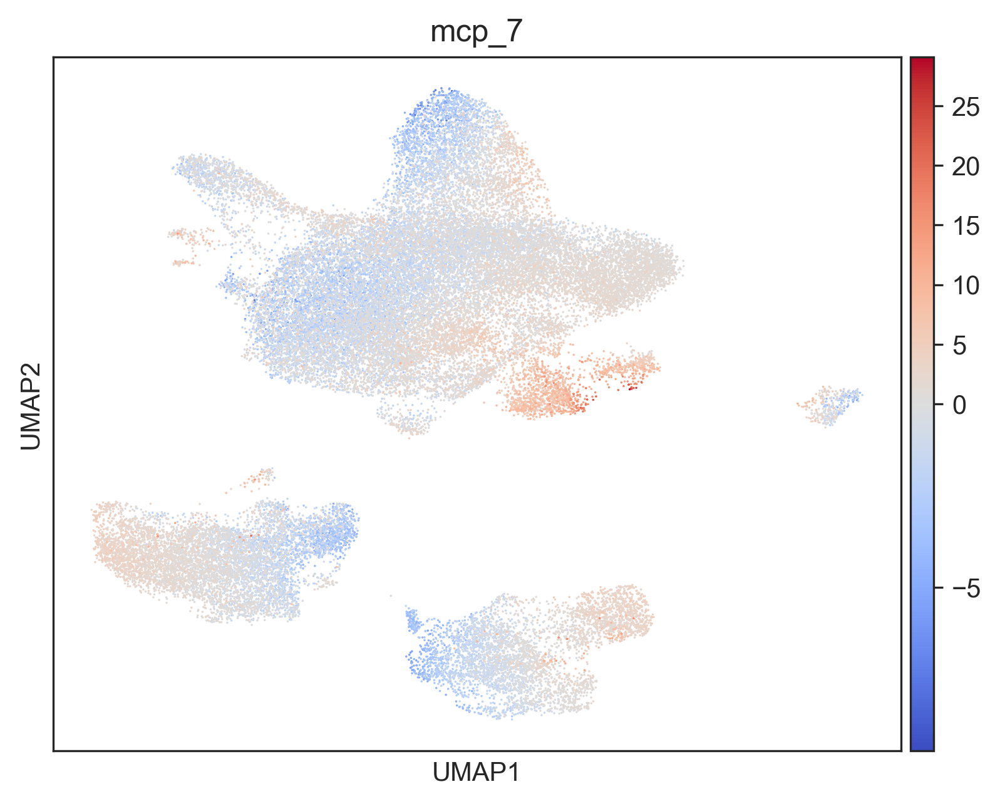

In [40]:
sc.pl.umap(adata_2, color="mcp_7", ncols=1, cmap='coolwarm', vcenter=0)


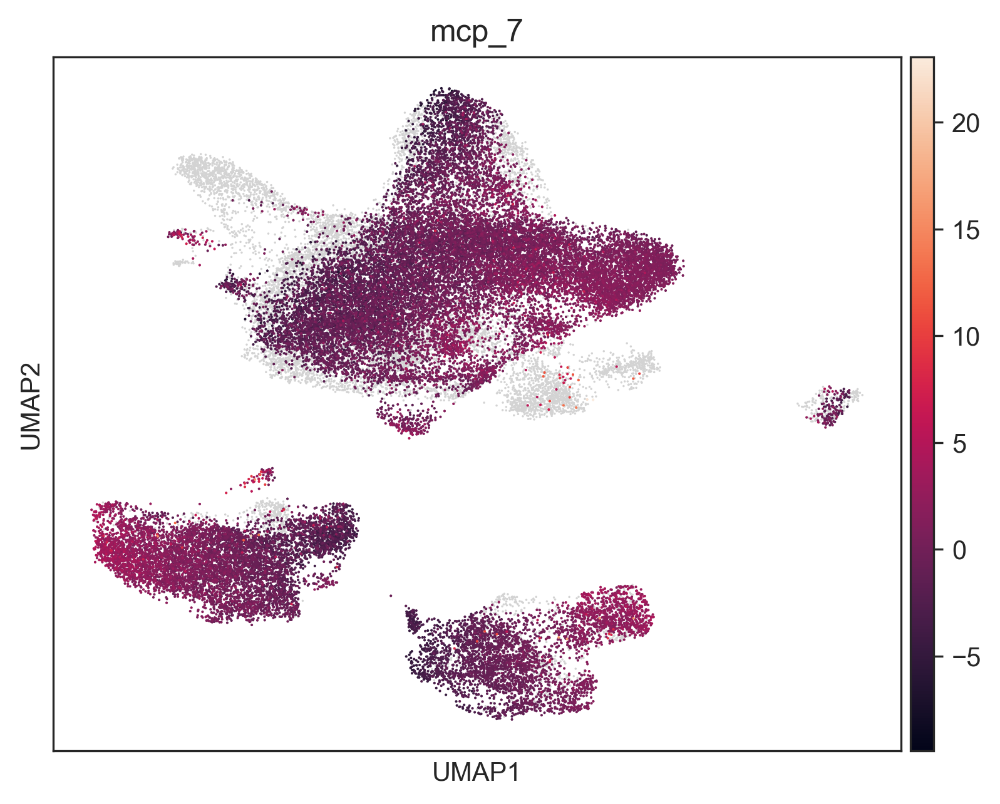

In [230]:
ax = plt.subplot()
sc.pl.umap(adata_2, ax=ax, show=False)
sc.pl.umap(adata_2[adata_2.obs["Efficacy"].isin(["PR"])], color="mcp_7", ax=ax, show=False)
plt.show()

In [94]:
all_results_2, new_mcps_2 = dl_2.multilevel_modeling(ct_subs=ct_subs_2,
                                     mcp_scores=mcps_2,
                                     ws_dict=ws_2,
                                     confounder="Treatment",
                                   )

Output()

10 MCPs identified for t_Bmem-CD27 and t_CD4_Tcm-LMNA.

10 MCPs identified for t_Bmem-CD27 and t_CD4_Treg-FOXP3.

10 MCPs identified for t_Bmem-CD27 and t_CD8_MAIT-KLRB1.

10 MCPs identified for t_Bmem-CD27 and t_CD8_Tem-GZMK.

10 MCPs identified for t_Bmem-CD27 and t_CD8_Trm-ZNF683.

10 MCPs identified for t_Bmem-CD27 and t_Tn-LEF1.

10 MCPs identified for t_Bmem-CD27 and t_mono-FCN1.

In [96]:
all_results_2.keys()

dict_keys(['t_Bmem-CD27_vs_t_CD4_Tcm-LMNA', 't_Bmem-CD27_vs_t_CD4_Treg-FOXP3', 't_Bmem-CD27_vs_t_CD8_MAIT-KLRB1', 't_Bmem-CD27_vs_t_CD8_Tem-GZMK', 't_Bmem-CD27_vs_t_CD8_Trm-ZNF683', 't_Bmem-CD27_vs_t_Tn-LEF1', 't_Bmem-CD27_vs_t_mono-FCN1', 't_Bmem-CD27_vs_t_pB-IGHG1', 't_CD4_Tcm-LMNA_vs_t_CD4_Treg-FOXP3', 't_CD4_Tcm-LMNA_vs_t_CD8_MAIT-KLRB1', 't_CD4_Tcm-LMNA_vs_t_CD8_Tem-GZMK', 't_CD4_Tcm-LMNA_vs_t_CD8_Trm-ZNF683', 't_CD4_Tcm-LMNA_vs_t_Tn-LEF1', 't_CD4_Tcm-LMNA_vs_t_mono-FCN1', 't_CD4_Tcm-LMNA_vs_t_pB-IGHG1', 't_CD4_Treg-FOXP3_vs_t_CD8_MAIT-KLRB1', 't_CD4_Treg-FOXP3_vs_t_CD8_Tem-GZMK', 't_CD4_Treg-FOXP3_vs_t_CD8_Trm-ZNF683', 't_CD4_Treg-FOXP3_vs_t_Tn-LEF1', 't_CD4_Treg-FOXP3_vs_t_mono-FCN1', 't_CD4_Treg-FOXP3_vs_t_pB-IGHG1', 't_CD8_MAIT-KLRB1_vs_t_CD8_Tem-GZMK', 't_CD8_MAIT-KLRB1_vs_t_CD8_Trm-ZNF683', 't_CD8_MAIT-KLRB1_vs_t_Tn-LEF1', 't_CD8_MAIT-KLRB1_vs_t_mono-FCN1', 't_CD8_MAIT-KLRB1_vs_t_pB-IGHG1', 't_CD8_Tem-GZMK_vs_t_CD8_Trm-ZNF683', 't_CD8_Tem-GZMK_vs_t_Tn-LEF1', 't_CD8_Tem-GZMK_

In [102]:
all_results_2['t_Bmem-CD27_vs_t_CD4_Tcm-LMNA']['MCP9']['sig_genes_1']

{'MCP9.up': ['ADGRE5',
  'CAPG',
  'CCR7',
  'CD74',
  'CD82',
  'CD83',
  'CD99',
  'CDKN1A',
  'CLIC1',
  'CSRNP1',
  'CTSW',
  'CXCR3',
  'DDIT3',
  'EGR2',
  'EMP3',
  'FCRLA',
  'FLNA',
  'GPR183',
  'HLA-DMB',
  'HLA-DPA1',
  'HSPA5',
  'HSPB1',
  'IFI6',
  'IFITM1',
  'INSIG1',
  'LCP1',
  'LMNA',
  'LSP1',
  'LY6E',
  'MS4A1',
  'NR4A3',
  'OASL',
  'PARP15',
  'PDE4B',
  'PHACTR1',
  'PLD4',
  'PLEK',
  'POU2F2',
  'PSAP',
  'PTPRC',
  'RALGAPA1',
  'RPS26',
  'RSAD2',
  'SAT1',
  'SH2D2A',
  'SLAMF1',
  'SLC2A3',
  'SRGN',
  'TCF4',
  'TNFSF10',
  'TYMP',
  'VIM',
  'VPS37B'],
 'MCP9.down': ['AC016831.7',
  'AC020916.1',
  'ANKRD37',
  'ARID5B',
  'BAG3',
  'BANK1',
  'BRD2',
  'BTG1',
  'CACYBP',
  'CD68',
  'CHMP1B',
  'CHORDC1',
  'CKS2',
  'CREM',
  'CTSC',
  'CTSZ',
  'CXCR4',
  'CXCR5',
  'DDX5',
  'DNAJA1',
  'DNAJB1',
  'DNAJB4',
  'DNAJB6',
  'DUSP1',
  'DUSP4',
  'DUSP5',
  'EGR4',
  'ELF1',
  'EZR',
  'FAM177A1',
  'FCRL4',
  'FGR',
  'FOS',
  'FOSB',
  'FOSL2',
  

In [103]:
pvals_2

,mcp_0,mcp_1,mcp_2,mcp_3,mcp_4,mcp_5,mcp_6,mcp_7,mcp_8,mcp_9
t_Bmem-CD27,0.310004,0.282239,0.256739,0.231698,0.206872,0.184201,0.178282,0.182127,0.166883,0.045383
t_CD4_Tcm-LMNA,0.148392,0.142909,0.138914,0.135653,0.133086,0.132820,0.149913,0.165898,0.182158,0.044625
t_CD4_Treg-FOXP3,0.282168,0.276002,0.270366,0.264374,0.258762,0.258327,0.301227,0.339816,0.371245,0.099988
t_CD8_MAIT-KLRB1,0.183989,0.174777,0.166589,0.158533,0.150517,0.143562,0.147647,0.154864,0.166012,0.143123
t_CD8_Tem-GZMK,0.255913,0.242980,0.231025,0.219225,0.207368,0.196301,0.195042,0.195903,0.198859,0.140458
t_CD8_Trm-ZNF683,0.182319,0.175636,0.169802,0.164251,0.158849,0.154397,0.159821,0.163101,0.168662,0.149945
t_Tn-LEF1,0.168134,0.157120,0.148541,0.141139,0.134687,0.130999,0.147705,0.159392,0.173774,0.028501
t_mono-FCN1,0.584216,0.580220,0.574645,0.563744,0.544203,0.512347,0.468519,0.422200,0.418140,0.428275
t_pB-IGHG1,0.543557,0.500692,0.451773,0.391429,0.316196,0.223208,0.099959,0.050454,0.033683,0.408063


In [106]:
all_results_2['t_CD4_Tcm-LMNA_vs_t_Tn-LEF1']['MCP9']['sig_genes_1']

{'MCP9.up': ['ADAMTS12',
  'AL157402.2',
  'AP000851.1',
  'AP003119.2',
  'APOA2',
  'ARL4C',
  'BAIAP2L2',
  'CCDC3',
  'CCL2',
  'CCL3',
  'CCNA1',
  'CD207',
  'CD55',
  'CD7',
  'CHRDL2',
  'CLEC7A',
  'CLIC3',
  'COL1A2',
  'CRIP1',
  'CTSB',
  'CXCL1',
  'CYBA',
  'DAB2',
  'DBH',
  'ELF3',
  'ELF5',
  'EMP3',
  'ENAH',
  'EPN3',
  'FOXP4-AS1',
  'GADD45B',
  'GAL',
  'GJA4',
  'GNG2',
  'GNLY',
  'GRB14',
  'GZMH',
  'HES4',
  'HOXC10',
  'HSPB2',
  'ID2',
  'IER2',
  'IFIT1',
  'IGLV5-52',
  'KLK6',
  'KLK7',
  'KRT6A',
  'LAD1',
  'LAG3',
  'LDHA',
  'LUM',
  'MAGEA4',
  'MAL2',
  'MTRNR2L12',
  'MUC16',
  'NEAT1',
  'NKX1-2',
  'PBX4',
  'PIM3',
  'POSTN',
  'PQLC2L',
  'PTCHD1',
  'PTPN22',
  'RAMP2',
  'RNASE1',
  'SAMSN1',
  'SELENOP',
  'SERPINA3',
  'SLC38A2',
  'SLC6A11',
  'SLC7A5',
  'SMAD7',
  'SMIM22',
  'SNAI2',
  'SOX10',
  'SOX4',
  'SOX9',
  'SPP1',
  'SYTL2',
  'SYTL3',
  'TCEAL7',
  'TIMP3',
  'TNFAIP6',
  'TNFRSF18',
  'TNFRSF1B',
  'TNFRSF4',
  'TPD52L1',
 

In [109]:
all_results_2['t_CD4_Tcm-LMNA_vs_t_Tn-LEF1']['MCP9']['sig_genes_2']

{'MCP9.up': ['ANKRD37',
  'ANXA1',
  'ARID5B',
  'ATP2B4',
  'CACYBP',
  'CCL5',
  'CD44',
  'CD69',
  'CD74',
  'CD99',
  'CDKN1A',
  'CLIC1',
  'CRIP1',
  'CST7',
  'CXCR3',
  'DNAJB1',
  'DUSP2',
  'DUSP4',
  'DYNLL1',
  'FAAH2',
  'FABP5',
  'FOS',
  'FYB1',
  'GZMA',
  'GZMK',
  'H2AFZ',
  'H3F3B',
  'HERPUD1',
  'HIST1H4C',
  'HSP90AB1',
  'HSPA1A',
  'HSPE1',
  'ITGB2',
  'KLF6',
  'LDHA',
  'LMNA',
  'MARCKSL1',
  'MCL1',
  'NELL2',
  'NEU1',
  'NFKBIZ',
  'ODC1',
  'PBX4',
  'PDE4B',
  'PHLDA1',
  'RALGAPA1',
  'RGS2',
  'RHOB',
  'RPS26',
  'SAMSN1',
  'SAT1',
  'SDCBP',
  'SQSTM1',
  'SRGN',
  'TAGLN2',
  'TSPYL2',
  'TUBA4A',
  'UBB',
  'UBC',
  'VIM',
  'ZFP36',
  'ZFP36L2'],
 'MCP9.down': ['AC016831.7',
  'ADGRE5',
  'AREG',
  'BAG3',
  'BIRC3',
  'BRD2',
  'BTG1',
  'BTG2',
  'CALR',
  'CCR7',
  'CD28',
  'CD5',
  'CD6',
  'CD81',
  'CD82',
  'CEMIP2',
  'CITED2',
  'CKS2',
  'CRTAM',
  'CSRNP1',
  'DDIT3',
  'DDIT4',
  'DDX3X',
  'DDX5',
  'DNAJB4',
  'DNAJB6',
  'DUSP1

In [105]:
all_results_2.keys()

dict_keys(['t_Bmem-CD27_vs_t_CD4_Tcm-LMNA', 't_Bmem-CD27_vs_t_CD4_Treg-FOXP3', 't_Bmem-CD27_vs_t_CD8_MAIT-KLRB1', 't_Bmem-CD27_vs_t_CD8_Tem-GZMK', 't_Bmem-CD27_vs_t_CD8_Trm-ZNF683', 't_Bmem-CD27_vs_t_Tn-LEF1', 't_Bmem-CD27_vs_t_mono-FCN1', 't_Bmem-CD27_vs_t_pB-IGHG1', 't_CD4_Tcm-LMNA_vs_t_CD4_Treg-FOXP3', 't_CD4_Tcm-LMNA_vs_t_CD8_MAIT-KLRB1', 't_CD4_Tcm-LMNA_vs_t_CD8_Tem-GZMK', 't_CD4_Tcm-LMNA_vs_t_CD8_Trm-ZNF683', 't_CD4_Tcm-LMNA_vs_t_Tn-LEF1', 't_CD4_Tcm-LMNA_vs_t_mono-FCN1', 't_CD4_Tcm-LMNA_vs_t_pB-IGHG1', 't_CD4_Treg-FOXP3_vs_t_CD8_MAIT-KLRB1', 't_CD4_Treg-FOXP3_vs_t_CD8_Tem-GZMK', 't_CD4_Treg-FOXP3_vs_t_CD8_Trm-ZNF683', 't_CD4_Treg-FOXP3_vs_t_Tn-LEF1', 't_CD4_Treg-FOXP3_vs_t_mono-FCN1', 't_CD4_Treg-FOXP3_vs_t_pB-IGHG1', 't_CD8_MAIT-KLRB1_vs_t_CD8_Tem-GZMK', 't_CD8_MAIT-KLRB1_vs_t_CD8_Trm-ZNF683', 't_CD8_MAIT-KLRB1_vs_t_Tn-LEF1', 't_CD8_MAIT-KLRB1_vs_t_mono-FCN1', 't_CD8_MAIT-KLRB1_vs_t_pB-IGHG1', 't_CD8_Tem-GZMK_vs_t_CD8_Trm-ZNF683', 't_CD8_Tem-GZMK_vs_t_Tn-LEF1', 't_CD8_Tem-GZMK_

In [108]:
all_results_2['t_Bmem-CD27_vs_t_CD4_Tcm-LMNA' ]['MCP9']['sig_genes_1']

{'MCP9.up': ['ADGRE5',
  'CAPG',
  'CCR7',
  'CD74',
  'CD82',
  'CD83',
  'CD99',
  'CDKN1A',
  'CLIC1',
  'CSRNP1',
  'CTSW',
  'CXCR3',
  'DDIT3',
  'EGR2',
  'EMP3',
  'FCRLA',
  'FLNA',
  'GPR183',
  'HLA-DMB',
  'HLA-DPA1',
  'HSPA5',
  'HSPB1',
  'IFI6',
  'IFITM1',
  'INSIG1',
  'LCP1',
  'LMNA',
  'LSP1',
  'LY6E',
  'MS4A1',
  'NR4A3',
  'OASL',
  'PARP15',
  'PDE4B',
  'PHACTR1',
  'PLD4',
  'PLEK',
  'POU2F2',
  'PSAP',
  'PTPRC',
  'RALGAPA1',
  'RPS26',
  'RSAD2',
  'SAT1',
  'SH2D2A',
  'SLAMF1',
  'SLC2A3',
  'SRGN',
  'TCF4',
  'TNFSF10',
  'TYMP',
  'VIM',
  'VPS37B'],
 'MCP9.down': ['AC016831.7',
  'AC020916.1',
  'ANKRD37',
  'ARID5B',
  'BAG3',
  'BANK1',
  'BRD2',
  'BTG1',
  'CACYBP',
  'CD68',
  'CHMP1B',
  'CHORDC1',
  'CKS2',
  'CREM',
  'CTSC',
  'CTSZ',
  'CXCR4',
  'CXCR5',
  'DDX5',
  'DNAJA1',
  'DNAJB1',
  'DNAJB4',
  'DNAJB6',
  'DUSP1',
  'DUSP4',
  'DUSP5',
  'EGR4',
  'ELF1',
  'EZR',
  'FAM177A1',
  'FCRL4',
  'FGR',
  'FOS',
  'FOSB',
  'FOSL2',
  